# Customizar MobileNrtv2

Objetivo desse programa é modificar e retreinar o MobileNetV2 para executar outra tarefa diferente daquela em que foi treinado: distinguir gatos machos e fêmeas. Este é um exemplo de aprendizagem de transferência: usando o fato de que já aprendeu uma tarefa (classificação de imagem usando 1000 categorias) torna mais fácil aprender outra tarefa (distinguir gatos machos e fêmeas).

In [1]:
from keras.applications.mobilenet_v2 import MobileNetV2, decode_predictions, preprocess_input
from keras.layers import Dense
from keras import Model
from keras.preprocessing.image import ImageDataGenerator, array_to_img, load_img
from numpy import expand_dims
from PIL import Image
import requests
import tensorflow as tf
import numpy as np
from imageio import imread
from skimage.transform import resize
import matplotlib.pyplot as plt



# Criar o tamanho do dataset em imagens vazias (40 imagens)
data = np.empty((40, 224, 224, 3))

model = MobileNetV2(weights='imagenet')


14548992/14536120 [==============================] - 0s 0us/step


In [2]:
# Download e unzip do dataset
!wget https://pythontutorials.eu/data/cats.zip
!unzip cats.zip
!mkdir train


--2022-05-09 22:32:11--  https://pythontutorials.eu/data/cats.zip
Resolving pythontutorials.eu (pythontutorials.eu)... 149.210.154.33, 2a01:7c8:aab3:22::1
Connecting to pythontutorials.eu (pythontutorials.eu)|149.210.154.33|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2660852 (2.5M) [application/zip]
Saving to: ‘cats.zip’

cats.zip            100%[===================>]   2.54M  3.91MB/s    in 0.6s    

2022-05-09 22:32:12 (3.91 MB/s) - ‘cats.zip’ saved [2660852/2660852]

Archive:  cats.zip
   creating: cats/
  inflating: cats/f01.jpg            
  inflating: cats/f02.jpg            
  inflating: cats/f03.jpg            
  inflating: cats/f04.jpg            
  inflating: cats/f05.jpg            
  inflating: cats/f06.jpg            
  inflating: cats/f07.jpg            
  inflating: cats/f08.jpg            
  inflating: cats/f09.jpg            
  inflating: cats/f10.jpg            
  inflating: cats/f11.jpg            
  inflating: cats/f12.jpg            
 

Ler as imagens e separa-los em seus respctivos sexos. Cada imagem é primeiro lida, depois pré-processada para que os valores de pixel estejam na faixa de -1 a 1, depois redimensionada para 224 × 224 e, finalmente, atribuída à matriz de dados.

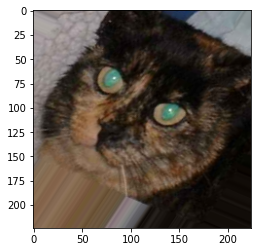

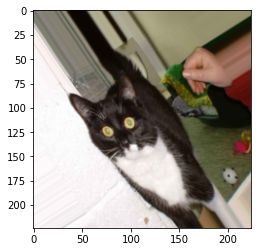

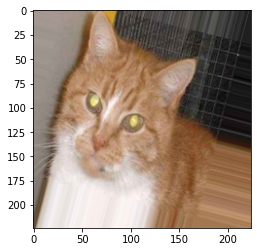

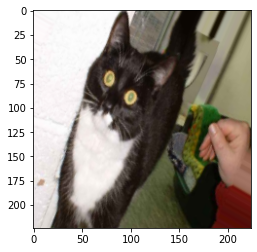

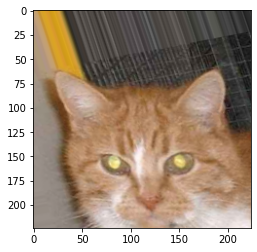

...

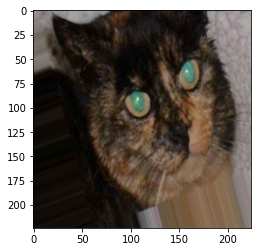

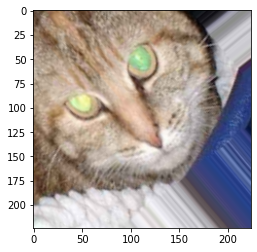

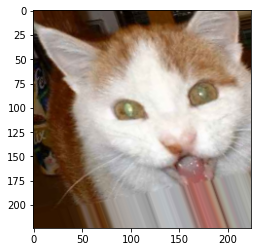

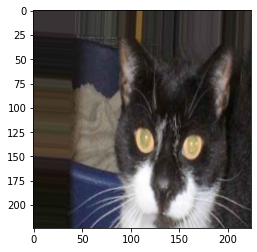

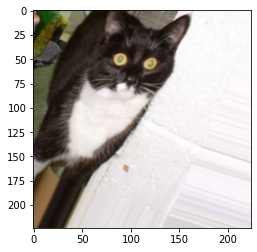

In [3]:
# Gatas

for i in range(0, 20):
    im = imread('cats/f{:02d}.jpg'.format(i + 1))
    im = preprocess_input(im)
    im = resize(im, output_shape=(224, 224))
    data[i] = im

# Data Augmentation
for name_img in range(1, 100):

  x = np.random.randint(1,20)

  image = array_to_img(data[x])
  samples = expand_dims(image, 0)

  datagen = ImageDataGenerator(
          rotation_range=40,
          width_shift_range=0.2,
          height_shift_range=0.2,
          shear_range=0.2,
          zoom_range=0.2,
          horizontal_flip=True,
          fill_mode='nearest')

  it = datagen.flow(samples, batch_size=1)
  batch = it.next()
  image = batch[0].astype('uint8')
  plt.imshow(image)
  im = Image.fromarray(image)
  # im.save(f"/content/train/f{name_img}.jpeg")
  im.save('/content/train/f{:02d}.jpg'.format(name_img))
  plt.show()


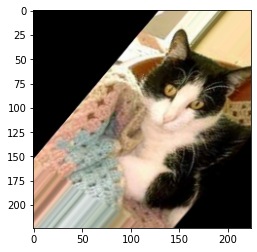

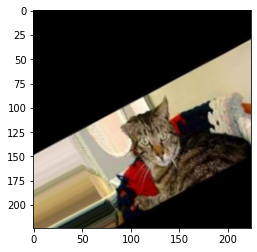

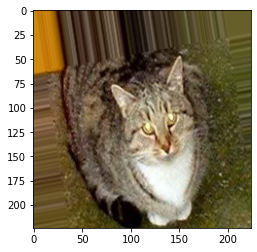

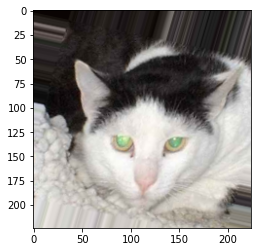

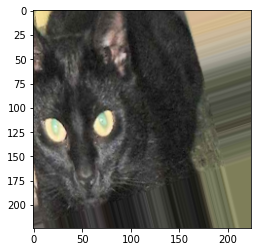

...

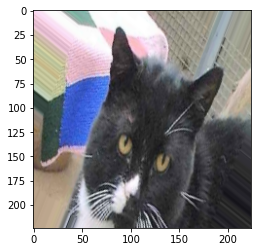

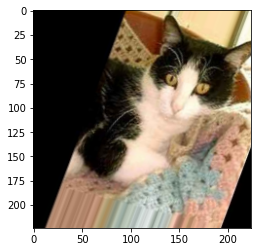

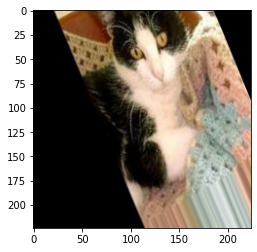

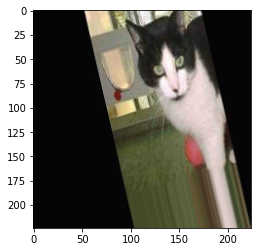

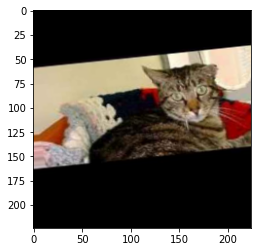

In [4]:
# Gatos

for i in range(0, 20):
    im = imread('cats/m{:02d}.jpg'.format(i + 1))
    im = preprocess_input(im)
    im = resize(im, output_shape=(224, 224))
    data[i + 20] = im


# Data Augmentation

for name_img in range(1, 100):

  x = np.random.randint(21,40)

  image = array_to_img(data[x])
  samples = expand_dims(image, 0)

  datagen = ImageDataGenerator(
          rotation_range=40,
          width_shift_range=0.2,
          height_shift_range=0.2,
          # shear_range=0.2,
          zoom_range=0.2,
          horizontal_flip=True,
          fill_mode='nearest')

  it = datagen.flow(samples, batch_size=1)
  batch = it.next()
  image = batch[0].astype('uint8')
  plt.imshow(image)
  im = Image.fromarray(image)
  # im.save(f"/content/train/m{name_img}.jpeg")
  im.save('/content/train/m{:02d}.jpg'.format(name_img))
  plt.show()



In [5]:
# Criar o banco de dados

data_train = np.empty((200, 224, 224, 3))

for i in range(0, 99):
    im = imread('train/f{:02d}.jpg'.format(i + 1))
    im = preprocess_input(im)
    im = resize(im, output_shape=(224, 224))
    data_train[i] = im

for i in range(0, 99):
    im = imread('train/m{:02d}.jpg'.format(i + 1))
    im = preprocess_input(im)
    im = resize(im, output_shape=(224, 224))
    data_train[i + 99] = im



labels = np.empty(200, dtype=int)
labels[:100] = 0
labels[100:] = 1


In [8]:
# Verificar se a rede reconhece os gatos
predictions = model.predict(data)
for decoded_prediction in decode_predictions(predictions, top=1):
    for name, desc, score in decoded_prediction:
        print('- {} ({:.2f}%%)'.format(desc, 100 * score))


49152/35363 [=========================================] - 0s 0us/step
- Siamese_cat (13.36%%)
- Angora (36.42%%)
- tabby (42.23%%)
- tiger_cat (69.27%%)
- tabby (66.41%%)
- Egyptian_cat (30.08%%)
- Siamese_cat (50.26%%)
- Persian_cat (73.12%%)
- tabby (84.13%%)
- Persian_cat (20.30%%)
- tabby (54.74%%)
- tabby (51.40%%)
- Egyptian_cat (53.58%%)
- tabby (48.33%%)
- Egyptian_cat (35.86%%)
- tabby (76.39%%)
- tabby (14.12%%)
- Egyptian_cat (11.90%%)
- Egyptian_cat (43.96%%)
- Egyptian_cat (52.69%%)
- Egyptian_cat (42.92%%)
- Egyptian_cat (51.84%%)
- Egyptian_cat (45.82%%)
- tabby (19.49%%)
- tabby (67.26%%)
- tabby (61.10%%)
- Egyptian_cat (43.09%%)
- Egyptian_cat (33.90%%)
- lynx (32.44%%)
- Egyptian_cat (40.90%%)
- Egyptian_cat (22.28%%)
- Egyptian_cat (30.10%%)
- Egyptian_cat (36.34%%)
- Siamese_cat (58.66%%)
- Egyptian_cat (29.08%%)
- Egyptian_cat (29.34%%)
- Egyptian_cat (21.58%%)
- Egyptian_cat (18.75%%)
- tiger_cat (69.53%%)
- tabby (43.84%%)


# Separar o dataset em treino e validação

Em outras palavras: precisamos de um conjunto de dados separado para validação. Uma maneira de fazer isso é dividir os dados originais em dois conjuntos, um consistindo em dados de treinamento (30 imagens) e outro consistindo em dados de validação (10 imagens). E então testamos quão bem o modelo é capaz de classificar os dados de validação depois de ter sido treinado apenas nos dados de treinamento.

Vamos primeiro criar dois novos conjuntos de dados, `training_data` e `validation_data`, bem como seus rótulos correspondentes, `training_labels` e `validation_labels`.

In [9]:
# Imagens para treinamento
training_data = np.empty((160, 224, 224, 3))
training_data[:80] = data_train[:80]
training_data[80:] = data_train[100:180]
training_labels = np.empty(160)
training_labels[:80] = 0
training_labels[80:] = 1

# Imagens para validação
validation_data = np.empty((40, 224, 224, 3))
validation_data[:20] = data_train[80:100]
validation_data[20:] = data_train[180:]
validation_labels = np.empty(40)
validation_labels[:20] = 0
validation_labels[20:] = 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


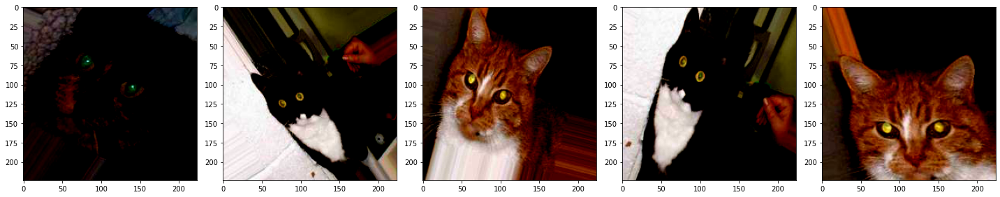

In [10]:
# Função para plot de imagens

def plotImages(images_arr, labels_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
    plt.tight_layout()
    plt.show()


augmented_images = [data_train[i] for i in range(5)]
plotImages(augmented_images, training_labels)

# Modificando a rede

O MobileNetV2 possui uma camada de saída que consiste em 1.000 neurônios, que correspondem às 1.000 categorias nas quais foi treinado. Mas aqui queremos classificar apenas duas categorias: gatos machos e fêmeas. Portanto, precisamos de uma camada de saída que consiste em apenas dois neurônios.

Primeiro criamos uma camada densamente conectada que usaremos como nossa camada de saída.

Em seguida, conectamos essa camada de saída à penúltima camada do MobileNetV2; ou seja, pulamos a camada de saída original e conectamos nossa própria camada de saída (cat_output) ao restante da rede.

Para fazer isso, primeiro obtemos a saída da penúltima camada (model.layers[-2].output) e, em seguida, chamamos cat_output como se fosse uma função e passamos essa saída como um argumento. O valor de retorno é um tipo especial de objeto (um KerasTensor).

In [11]:

cat_output = Dense(2, activation='softmax')
cat_output = cat_output(model.layers[-2].output)
cat_input2 = model.input
cat_model = Model(inputs=cat_input2, outputs=cat_output)

for layer in cat_model.layers[:-1]:
    layer.trainable = False


cat_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)



# Treinamento

In [13]:
history = cat_model.fit(
    x=training_data,
    y=training_labels,
    validation_data=(validation_data, validation_labels),
    epochs=20,
    verbose=2
)

Epoch 1/20
5/5 - 10s - loss: 0.8634 - accuracy: 0.4437 - val_loss: 0.7640 - val_accuracy: 0.5000 - 10s/epoch - 2s/step
Epoch 2/20
5/5 - 5s - loss: 0.6549 - accuracy: 0.5625 - val_loss: 0.5896 - val_accuracy: 0.7250 - 5s/epoch - 1s/step
Epoch 3/20
5/5 - 5s - loss: 0.5252 - accuracy: 0.7437 - val_loss: 0.4767 - val_accuracy: 0.8250 - 5s/epoch - 1s/step
Epoch 4/20
5/5 - 5s - loss: 0.4309 - accuracy: 0.8375 - val_loss: 0.4039 - val_accuracy: 0.7750 - 5s/epoch - 1s/step
Epoch 5/20
5/5 - 5s - loss: 0.3644 - accuracy: 0.8938 - val_loss: 0.3438 - val_accuracy: 0.8750 - 5s/epoch - 1s/step
Epoch 6/20
5/5 - 6s - loss: 0.3181 - accuracy: 0.8813 - val_loss: 0.3096 - val_accuracy: 0.8750 - 6s/epoch - 1s/step
Epoch 7/20
5/5 - 7s - loss: 0.2801 - accuracy: 0.9187 - val_loss: 0.2934 - val_accuracy: 0.8750 - 7s/epoch - 1s/step
Epoch 8/20
5/5 - 5s - loss: 0.2557 - accuracy: 0.9125 - val_loss: 0.2705 - val_accuracy: 0.9250 - 5s/epoch - 1s/step
Epoch 9/20
5/5 - 5s - loss: 0.2291 - accuracy: 0.9312 - val_lo

In [14]:

DownURL = 'https://storage.googleapis.com/cvstock-932a9.appspot.com/0CRMZK1WM3FV'

img_data = requests.get(DownURL).content
with open('image_name.jpg', 'wb') as handler:
    handler.write(img_data)


# Ler a imagem salva na raiz
image_input = imread('/content/image_name.jpg')

# Conveter a imagem para formato do MobileNetV2
image = tf.image.resize(image_input, (224, 224))

data = np.empty((1, 224, 224, 3))
data[0] = image
data = preprocess_input(data)

predictions = cat_model.predict(data)
print(np.argmax(predictions, axis=1))



[0]


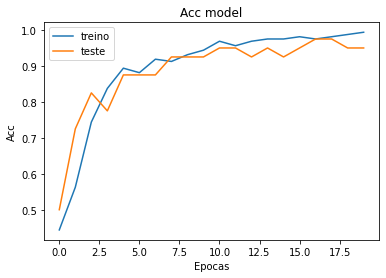

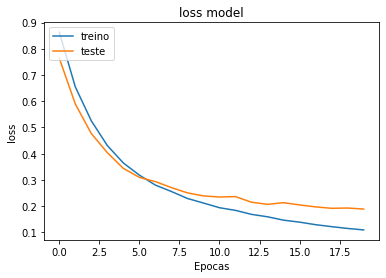

In [15]:


# Acc
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Acc model')
plt.ylabel('Acc')
plt.xlabel('Epocas')
plt.legend(['treino', 'teste'], loc='upper left')
plt.show()
# Loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('loss model')
plt.ylabel('loss')
plt.xlabel('Epocas')
plt.legend(['treino', 'teste'], loc='upper left')
plt.show()